In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import random
from typing import List, Tuple, Dict
from sqlalchemy import create_engine, text
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from torch import nn, optim
from transformers import AutoTokenizer, AutoModel, TrainingArguments
from tqdm import tqdm
from typing import List, Tuple, Dict
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score
import torch.nn.functional as F

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
DATASETDIR = "./GptCloneDatasetDataframes/df_python_contrastive.csv"


In [ ]:
class GPTCloneDataset(Dataset):
    def __init__(
        self,
        df,
        batch_size: int = 32,
        tokenizer_name: str = "microsoft/codebert-base",
        max_length: int = 512,

    ):
        """

        """

        self.df = df
        self.batch_size = batch_size
        self.tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
        self.max_length = max_length
        self.cached = {}  # Dictionary to store cached files

    def __len__(self) -> int:
        return len(self.df)

    def __getitem__(self, idx: int) -> Dict[str, torch.Tensor]:
        if idx in self.cached:
            return self.cached[idx]

        function_text_one ,function_text_two, label= self.df.iloc[idx]

        # Tokenize again with truncation
        tokens_code1 = self.tokenizer(
            function_text_one,
            max_length=self.max_length,
            padding="max_length",
            truncation=True,
            return_tensors="pt"
        )

        tokens_code2 = self.tokenizer(
            function_text_two,
            max_length=self.max_length,
            padding="max_length",
            truncation=True,
            return_tensors="pt"
        )

        label = torch.tensor(label, dtype=torch.long)

        self.cached[idx] = {
            'function_one_input_ids': tokens_code1['input_ids'].squeeze(0),
            'function_one_attention_mask': tokens_code1['attention_mask'].squeeze(0),
            'function_two_input_ids': tokens_code2['input_ids'].squeeze(0),
            'function_two_attention_mask': tokens_code2['attention_mask'].squeeze(0),
            'function_text_one':function_text_one,
            'function_text_two':function_text_two,
            'label' : label
        }
        # Squeeze the tensors to remove the extra dimension added by return_tensors="pt"
        return self.cached[idx]





In [ ]:

def get_dataloaders(
    batch_size: int = 4,
    num_workers=4,
    ):
    """
    Create train, validation, and test dataloaders along with the original datasets
    """
    df = pd.read_csv(DATASETDIR, index_col=  None)

    print(f"df loaded with {len(df)} rows and {df.columns} columns")

    # Split into train, validation, and test sets
    train_size = int(0.8 * len(df))
    val_size = int(0.05 * len(df))

    train_df = df.iloc[:train_size]
    val_df = df.iloc[train_size:train_size + val_size]
    test_df = df.iloc[train_size + val_size:]

    train_dataset = GPTCloneDataset(train_df)
    test_dataset = GPTCloneDataset(test_df)
    validation_dataset = GPTCloneDataset(val_df)
    Traindataloader = DataLoader( train_dataset,
    batch_size=batch_size,
    shuffle=True,)
    Testdataloader = DataLoader( test_dataset,
    batch_size=batch_size,
    shuffle=True,)
    validationDataloader = DataLoader( validation_dataset,
    batch_size=batch_size,
    shuffle=True,)


    return Traindataloader,validationDataloader, Testdataloader



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from transformers import AutoModel

class CodeCloneDetectionModel(nn.Module):
    def __init__(
        self,
        model_name: str = "microsoft/codebert-base",
        embedding_dim: int = 768,
        dropout_rate: float = 0.1
    ):
        super().__init__()
        self.model = AutoModel.from_pretrained(model_name)
        hidden_size = self.model.config.hidden_size
        # Final projection to embedding dimension
        self.final_projection = nn.Sequential(
            nn.Linear(hidden_size, embedding_dim),
            nn.LayerNorm(embedding_dim)
        )
    def preprocess_code(self, code_text: str) -> dict:
        inputs = self.tokenizer(
            code_text,
            return_tensors="pt",
            max_length=512,
            padding="max_length",
            truncation=True
        )

        return {k: v.to(self.device) for k, v in inputs.items()}


    def encode(self, input_ids, attention_mask):
        # Get BERT embeddings
        with torch.no_grad():  # Ensure BERT layers don't compute gradients
            outputs = self.model(input_ids=input_ids, attention_mask=attention_mask)

        # Get CLS token
        x = outputs.last_hidden_state[:, 0, :]  # [batch_size, hidden_size]
        # Final projection
        embedding = self.final_projection(x)  # [batch_size, embedding_dim]
        return F.normalize(embedding, p=2, dim=1)

    def forward(self, function1_ids, function1_mask, function2_ids, function2_mask):
        emb1 = self.encode(function1_ids, function1_mask)
        emb2 = self.encode(function2_ids, function2_mask)
        return emb1, emb2







In [ ]:
class ContrastiveLoss(nn.Module):
    def __init__(self, margin: float = 1.0):
        super().__init__()
        self.margin = margin

    def forward(self, emb1: torch.Tensor, emb2: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
        # Normalize embeddings
        emb1 = F.normalize(emb1, p=2, dim=1)
        emb2 = F.normalize(emb2, p=2, dim=1)

        # Calculate euclidean distance
        distance = torch.norm(emb1 - emb2, dim=1)

        # Scale distances to increase separation
        distance = distance * 2  # Optional scaling factor

        pos_loss = labels * distance.pow(2)
        neg_loss = (1 - labels) * torch.pow(torch.clamp(self.margin - distance, min=0), 2)

        loss = torch.mean(pos_loss + neg_loss)
        return loss


In [ ]:
class CosineTripletLoss(nn.Module):
    def __init__(self, margin=0.5, lambda_reg=0.01):
        super(CosineTripletLoss, self).__init__()
        self.margin = margin
        self.lambda_reg = lambda_reg

    def forward(self, anchor, positive, negative):

        # Compute cosine similarities
        pos_sim = F.cosine_similarity(anchor, positive, dim=1)
        neg_sim = F.cosine_similarity(anchor, negative, dim=1)

        # Basic triplet loss
        triplet_loss = torch.relu(neg_sim - pos_sim + self.margin)

        # Add regularization to push negative pairs further apart
        neg_push = torch.relu(neg_sim + 0.1)  # Penalize negative similarities above -0.1

        # Add regularization to ensure embeddings are well-distributed
        diversity_reg = (torch.mean(torch.matmul(anchor, anchor.t())) +
                        torch.mean(torch.matmul(positive, positive.t())) +
                        torch.mean(torch.matmul(negative, negative.t())))

        # Combine losses
        total_loss = triplet_loss.mean() + self.lambda_reg * neg_push.mean() + \
                    self.lambda_reg * torch.relu(diversity_reg - 1.5)

        return total_loss


In [ ]:
import json
import shutil

def save_model(model, tokenizer, save_dir='saved_model', base_path=None):
    """
    Save the model, tokenizer, and configuration
    """
    print("saving best model")
    if base_path is None:
        base_path = Path('/content/drive/MyDrive')

    # Create full save path
    save_path = base_path / save_dir

    # Create temporary local directory for saving
    local_save_path = Path('/content/temp_save')
    local_save_path.mkdir(parents=True, exist_ok=True)

    # Save model state locally first
    torch.save(model.state_dict(), local_save_path / 'modelsiamese.pth')

    # Save tokenizer locally
    tokenizer.save_pretrained(local_save_path)

    # Save configuration
    config = {
        'model_name': model.model.config._name_or_path,
        'hidden_size': model.model.config.hidden_size,
        'max_length': 512
    }

    with open(local_save_path / 'config.json', 'w') as f:
        json.dump(config, f)

    # Create the save directory in Google Drive
    save_path.mkdir(parents=True, exist_ok=True)

    # Copy everything from local to Drive
    shutil.copytree(local_save_path, save_path, dirs_exist_ok=True)

    # Clean up local files
    shutil.rmtree(local_save_path)

    print(f"Model saved successfully to Google Drive at: {save_path}")
    return save_path


def save_checkpoint(model, tokenizer, epoch, optimizer, loss, save_dir='checkpoints'):
    """
    Save a training checkpoint including optimizer state and epoch
    """
    save_path = Path('/content/drive/MyDrive') / save_dir
    save_path.mkdir(parents=True, exist_ok=True)

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss,
    }

    # Save checkpoint
    torch.save(checkpoint, save_path / f'checkpoint_epoch_{epoch}.pt')

    # Save latest model and tokenizer
    save_model(model, tokenizer, save_dir=f'{save_dir}/latest')



In [ ]:

class CodeClonePredictor:
    def __init__(self, model, tokenizer, device=None):
        if device is None:
            self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        else:
            self.device = device

        self.model = model.to(self.device)
        self.tokenizer = tokenizer
        self.model.eval()

    def get_embedding(self, code_text):
        tokens = self.tokenizer(
            code_text,
            max_length=512,
            padding="max_length",
            truncation=True,
            return_tensors="pt"
        )

        input_ids = tokens['input_ids'].to(self.device)
        attention_mask = tokens['attention_mask'].to(self.device)

        with torch.no_grad():
            embedding = self.model.encode(input_ids, attention_mask)

        return F.normalize(embedding, p=2, dim=1)

    def get_embedding_from_tokens(self, input_ids,attention_mask):

        with torch.no_grad():
            embedding = self.model.encode(input_ids, attention_mask)
        return F.normalize(embedding, p=2, dim=1)

    def compare_codes(self, code1, code2):
        """Compare two code snippets and return their similarity score"""

        emb1 = self.get_embedding(code1)
        emb2 = self.get_embedding(code2)
        similarity = F.cosine_similarity(emb1, emb2).item()
        return similarity



    def find_clones(self, query_code, code_list, threshold=0.8):
        """Find potential clones of query_code in code_list"""
        query_emb = self.get_embedding(query_code)
        results = []

        for idx, code in enumerate(code_list):
            code_emb = self.get_embedding(code)
            similarity = F.cosine_similarity(query_emb, code_emb).item()

            if similarity >= threshold:
                results.append({
                    'index': idx,
                    'similarity': similarity,
                    'code': code
                })

        # Sort by similarity in descending order
        results.sort(key=lambda x: x['similarity'], reverse=True)
        return results


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import roc_auc_score


def train_model(model, train_loader, val_loader, test_loader, optimizer, criterion, device, num_epochs=5):
    training_history = []
    min_val_loss = float('inf')
    tokenizer = AutoTokenizer.from_pretrained("microsoft/codebert-base")

    # Store similarities, labels, and epochs for plotting
    similarity_data = []

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        total_train_loss = 0
        print(f"Epoch {epoch + 1}:")

        for batch in tqdm(train_loader, desc="Training"):
            optimizer.zero_grad()

            # Move data to device
            function_one_input_ids = batch['function_one_input_ids'].to(device)
            function_one_attention_mask = batch['function_one_attention_mask'].to(device)
            function_two_input_ids = batch['function_two_input_ids'].to(device)
            function_two_attention_mask = batch['function_two_attention_mask'].to(device)
            labels = batch['label'].to(device)

            # Forward pass
            emb_one, emb_two = model(
                function_one_input_ids, function_one_attention_mask,
                function_two_input_ids, function_two_attention_mask,
            )

            # Calculate loss
            loss = criterion(emb_one, emb_two, labels)
            total_train_loss += loss.item()

            # Backward pass
            loss.backward()
            optimizer.step()

        print("training loss", total_train_loss / len(train_loader))

        # Validation phase
        print("\nEvaluating on validation set...")
        total_val_loss = 0
        with torch.no_grad():
            for batch in tqdm(val_loader, desc="Validation"):
                # Move data to device
                function_one_input_ids = batch['function_one_input_ids'].to(device)
                function_one_attention_mask = batch['function_one_attention_mask'].to(device)
                function_two_input_ids = batch['function_two_input_ids'].to(device)
                function_two_attention_mask = batch['function_two_attention_mask'].to(device)
                labels = batch['label'].to(device)
                # Forward pass
                emb_one, emb_two = model(
                    function_one_input_ids, function_one_attention_mask,
                    function_two_input_ids, function_two_attention_mask,
                )

                # Calculate loss
                loss = criterion(emb_one, emb_two, labels)
                total_val_loss += loss.item()



                # Get similarity scores for the validation set

                predictor = CodeClonePredictor(model, tokenizer)
                for i in range(len(batch['function_one_input_ids'])):
                    code1 = batch['function_text_one'][i]
                    code2 = batch['function_text_two'][i]
                    similarity = predictor.compare_codes(code1, code2)
                    similarity_data.append({
                        'epoch': epoch + 1,
                        'similarity': similarity,
                        'label': batch['label'][i]
                    })

        avg_val_loss = total_val_loss / len(val_loader)
        if avg_val_loss < min_val_loss:
            min_val_loss = avg_val_loss
            save_model(model, tokenizer, save_dir='saved_model')

        auc = calculate_auc(similarity_data, epoch)
        print(f"val Loss: {avg_val_loss:.4f} AUC {auc}\n")
        plot_similarity_scatter(similarity_data)
    # Scatter Plot
    plot_similarity_scatter(similarity_data)

    return training_history, avg_val_loss , similarity_data



def calculate_auc(similarity_data, epoch=None):
    """Calculate AUC for a specific epoch or all data if epoch is None"""
    df = pd.DataFrame(similarity_data)

    if epoch is not None:
        df = df[df['epoch'] == epoch+1]
    # Get the true labels and similarity scores
    y_true = [f.item() for f in df['label']]
    y_scores = df['similarity']
    # Calculate ROC AUC
    auc = roc_auc_score(y_true, y_scores)
    return auc

def plot_similarity_scatter(similarity_data, testing=False):
    df = pd.DataFrame(similarity_data)
    jitter_strength = 0.2

    if not testing:
        df['epoch_jittered'] = df['epoch'] + np.random.uniform(-jitter_strength, jitter_strength, len(df))

        unique_epochs = sorted(df['epoch'].unique())
        aucs = []
        for e in unique_epochs:
            current_df = df[df['epoch'] == e]
            y_true = [f.item() for f in current_df['label']]
            y_scores = current_df['similarity']
            auc = roc_auc_score(y_true, y_scores)
            aucs.append((e, auc))

        best_epoch, best_auc = max(aucs, key=lambda x: x[1])
        title = f"Similarity of Samples by Epoch (Best AUC: {best_auc:.3f} at Epoch {int(best_epoch)})"
    else:
        df['epoch_jittered'] = 1 + np.random.uniform(-jitter_strength, jitter_strength, len(df))
        auc = calculate_auc(similarity_data)
        title = f"Similarity (AUC: {auc:.3f})"


    plt.figure(figsize=(20, 10))

    # Plot points
    for label, color, marker in [(1, 'green', 'o'), (0, 'red', 'x')]:
        subset = df[df['label'] == label]
        plt.scatter(
            subset['epoch_jittered'],
            subset['similarity'],
            c=color,
            label=f'Clone={label}',
            alpha=0.7,
            marker=marker,
            s=40
        )

    plt.xlabel("Epoch")
    plt.ylabel("Similarity (0 to 1)")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
def test_model(model, test_loader, device):
    model.eval()
    similarity_data = []
    with torch.no_grad():
        for batch in tqdm(test_loader, desc="Testing"):
            # Move data to device
            function_one_input_ids = batch['function_one_input_ids'].to(device)
            function_one_attention_mask = batch['function_one_attention_mask'].to(device)
            function_two_input_ids = batch['function_two_input_ids'].to(device)
            function_two_attention_mask = batch['function_two_attention_mask'].to(device)
            labels = batch['label'].to(device)
            # Forward pass
            emb_one, emb_two = model(
                function_one_input_ids, function_one_attention_mask,
                function_two_input_ids, function_two_attention_mask,
            )

            # Get similarity scores for the validation set

            predictor = CodeClonePredictor(model, tokenizer)
            for i in range(len(batch['function_one_input_ids'])):
                code1 = batch['function_text_one'][i]
                code2 = batch['function_text_two'][i]
                label = batch['label'][i]
                similarity = predictor.compare_codes(code1, code2)
                similarity_data.append({
                    'similarity': similarity,
                    'label': label
                })

    # Scatter Plot
    plot_similarity_scatter(similarity_data, testing= True)

    return similarity_data


In [ ]:
from pathlib import Path
def load_model(save_dir='code_clone_model', base_path=None):
    """
    Load the saved model from Google Drive

    Args:
        save_dir: Directory name where the model is saved
        base_path: Base path in Google Drive (default is /content/drive/MyDrive)
    """
    if base_path is None:
        base_path = Path('/content/drive/MyDrive')

    save_path = base_path / save_dir

    # Verify that the save directory exists
    if not save_path.exists():
        raise FileNotFoundError(f"No saved model found at {save_path}")

    # Load configuration
    with open(save_path / 'config.json', 'r') as f:
        config = json.load(f)

    # Initialize model
    model = CodeCloneDetectionModel(model_name=config['model_name'])

    # Load model state
    model.load_state_dict(torch.load(save_path / 'modelsiamese.pth', weights_only=True))

    # Load tokenizer
    tokenizer = AutoTokenizer.from_pretrained(save_path)

    print(f"Model loaded successfully from: {save_path}")
    return model, tokenizer, config



In [ ]:

def start_training(load_trained_model = False):
    Traindataloader,validationDataloader, Testdataloader  = get_dataloaders(
        batch_size=32,
        num_workers=16
    )

    print("working with cuda") if torch.cuda.is_available() else print("working with cpu")
    if load_trained_model:
        model, tokenizer, config = load_model('saved_model')
        model = model.to(device)
    else:
        model = CodeCloneDetectionModel().to(device)
        tokenizer = AutoTokenizer.from_pretrained("microsoft/codebert-base")

    optimizer = optim.AdamW(model.parameters(), lr= 1e-3, weight_decay=1e-4)
    criterion = ContrastiveLoss(margin=1.0)

    training_history, avg_val_loss ,similarity_data = train_model(
        model,
        Traindataloader,
        validationDataloader,
        Testdataloader,
        optimizer,
        criterion,
        device,
        num_epochs=20
    )
    # Save the model after training
    save_model(model, tokenizer, save_dir='saved_model')
    return model, tokenizer ,training_history , similarity_data


df loaded with 18894 rows and Index(['function 1', 'function 2', 'clone'], dtype='object') columns
working with cuda
Epoch 1:


Training: 100%|██████████| 473/473 [03:23<00:00,  2.32it/s]


training loss 0.17707561172277175

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:30<00:00,  1.02s/it]


saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model
Before
     epoch  similarity      label
0        1    0.946130  tensor(0)
1        1    0.966784  tensor(0)
2        1    0.904649  tensor(0)
3        1    0.978995  tensor(0)
4        1    0.933279  tensor(0)
..     ...         ...        ...
939      1    0.905911  tensor(0)
940      1    0.994522  tensor(1)
941      1    0.915739  tensor(0)
942      1    0.988436  tensor(1)
943      1    0.992840  tensor(1)

[944 rows x 3 columns]
after
     epoch  similarity      label
0        1    0.946130  tensor(0)
1        1    0.966784  tensor(0)
2        1    0.904649  tensor(0)
3        1    0.978995  tensor(0)
4        1    0.933279  tensor(0)
..     ...         ...        ...
939      1    0.905911  tensor(0)
940      1    0.994522  tensor(1)
941      1    0.915739  tensor(0)
942      1    0.988436  tensor(1)
943      1    0.992840  tensor(1)

[944 rows x 3 columns]
[0, 0, 0, 0, 0, 0, 0, 1, 

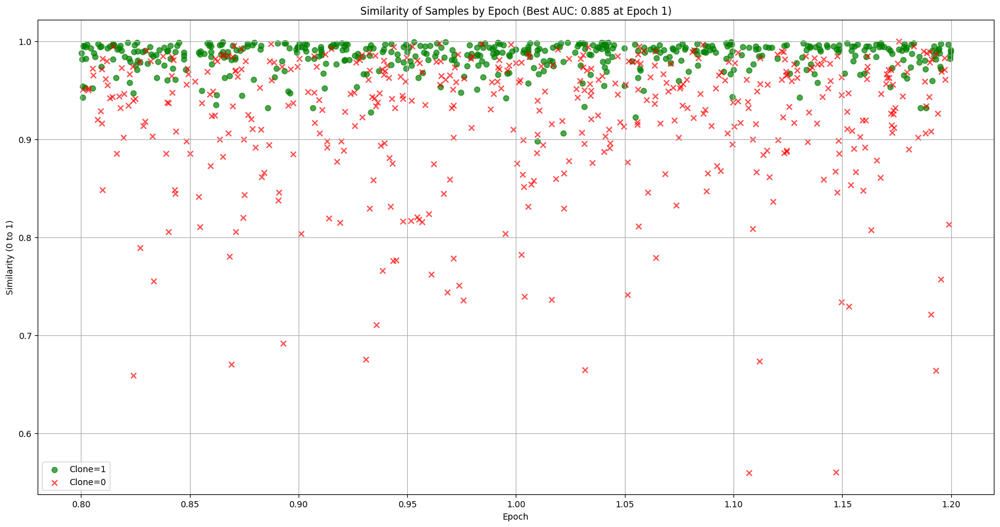

Epoch 2:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.1311045423244573

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model
Before
      epoch  similarity      label
0         1    0.946130  tensor(0)
1         1    0.966784  tensor(0)
2         1    0.904649  tensor(0)
3         1    0.978995  tensor(0)
4         1    0.933279  tensor(0)
...     ...         ...        ...
1883      2    0.991246  tensor(0)
1884      2    0.968117  tensor(1)
1885      2    0.896702  tensor(0)
1886      2    0.997041  tensor(1)
1887      2    0.703224  tensor(0)

[1888 rows x 3 columns]
after
      epoch  similarity      label
944       2    0.969103  tensor(0)
945       2    0.828044  tensor(0)
946       2    0.984289  tensor(0)
947       2    0.994749  tensor(1)
948       2    0.995512  tensor(1)
...     ...         ...        ...
1883      2    0.991246  tensor(0)
1884      2    0.968117  tensor(1)
1885      2    0.896702  tensor(0)
1886      2    0.997041  tensor(1)
1887      2    0.703224  tensor(0)

[944 rows x 3 columns]


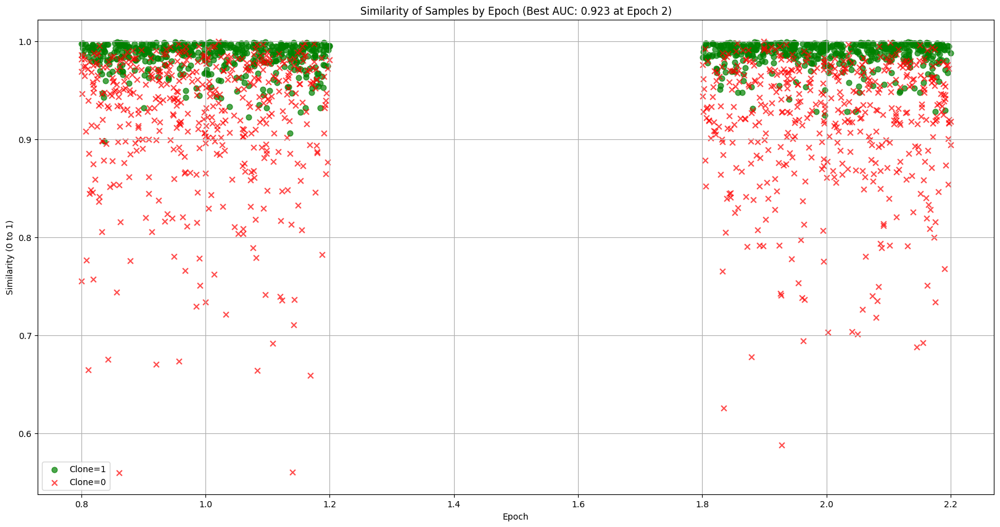

Epoch 3:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.12290691796997384

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model
Before
      epoch  similarity      label
0         1    0.946130  tensor(0)
1         1    0.966784  tensor(0)
2         1    0.904649  tensor(0)
3         1    0.978995  tensor(0)
4         1    0.933279  tensor(0)
...     ...         ...        ...
2827      3    0.993146  tensor(1)
2828      3    0.782600  tensor(0)
2829      3    0.924573  tensor(0)
2830      3    0.972567  tensor(0)
2831      3    0.998650  tensor(1)

[2832 rows x 3 columns]
after
      epoch  similarity      label
1888      3    0.998995  tensor(1)
1889      3    0.986117  tensor(0)
1890      3    0.785729  tensor(0)
1891      3    0.929084  tensor(0)
1892      3    0.963418  tensor(0)
...     ...         ...        ...
2827      3    0.993146  tensor(1)
2828      3    0.782600  tensor(0)
2829      3    0.924573  tensor(0)
2830      3    0.972567  tensor(0)
2831      3    0.998650  tensor(1)

[944 rows x 3 columns]


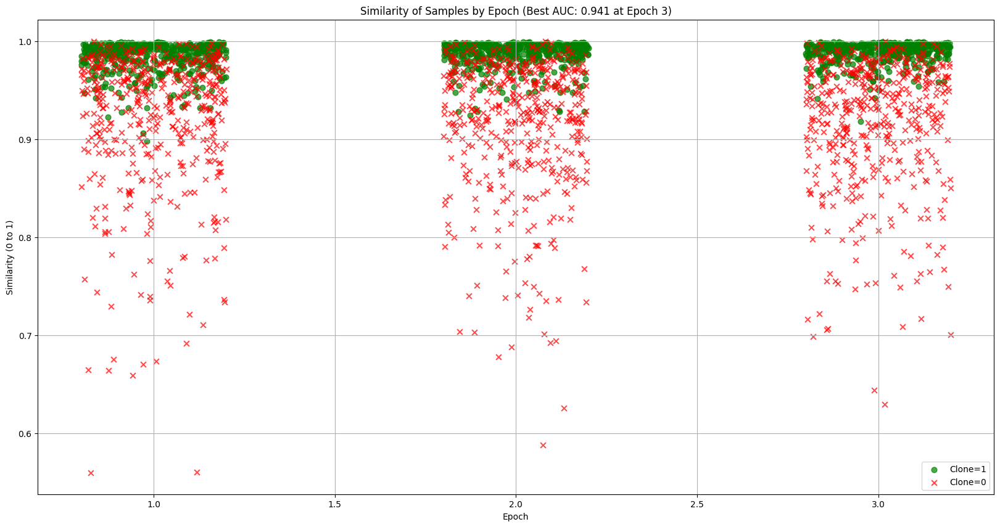

Epoch 4:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11913435729752131

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model
Before
      epoch  similarity      label
0         1    0.946130  tensor(0)
1         1    0.966784  tensor(0)
2         1    0.904649  tensor(0)
3         1    0.978995  tensor(0)
4         1    0.933279  tensor(0)
...     ...         ...        ...
3771      4    0.950104  tensor(0)
3772      4    0.859797  tensor(0)
3773      4    0.813292  tensor(0)
3774      4    0.654398  tensor(0)
3775      4    0.994052  tensor(1)

[3776 rows x 3 columns]
after
      epoch  similarity      label
2832      4    0.971001  tensor(1)
2833      4    0.996030  tensor(1)
2834      4    1.000000  tensor(0)
2835      4    0.967226  tensor(0)
2836      4    0.965490  tensor(1)
...     ...         ...        ...
3771      4    0.950104  tensor(0)
3772      4    0.859797  tensor(0)
3773      4    0.813292  tensor(0)
3774      4    0.654398  tensor(0)
3775      4    0.994052  tensor(1)

[944 rows x 3 columns]


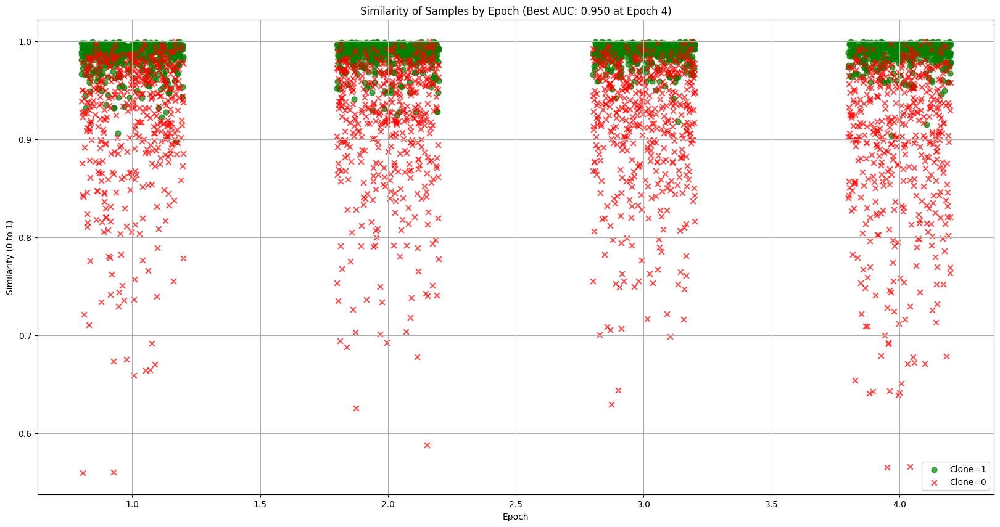

Epoch 5:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11532216562434684

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model
Before
      epoch  similarity      label
0         1    0.946130  tensor(0)
1         1    0.966784  tensor(0)
2         1    0.904649  tensor(0)
3         1    0.978995  tensor(0)
4         1    0.933279  tensor(0)
...     ...         ...        ...
4715      5    0.677648  tensor(0)
4716      5    0.873814  tensor(0)
4717      5    0.994076  tensor(1)
4718      5    0.845433  tensor(0)
4719      5    0.988920  tensor(1)

[4720 rows x 3 columns]
after
      epoch  similarity      label
3776      5    0.851382  tensor(0)
3777      5    0.977922  tensor(1)
3778      5    0.986545  tensor(0)
3779      5    0.808907  tensor(0)
3780      5    0.996455  tensor(1)
...     ...         ...        ...
4715      5    0.677648  tensor(0)
4716      5    0.873814  tensor(0)
4717      5    0.994076  tensor(1)
4718      5    0.845433  tensor(0)
4719      5    0.988920  tensor(1)

[944 rows x 3 columns]


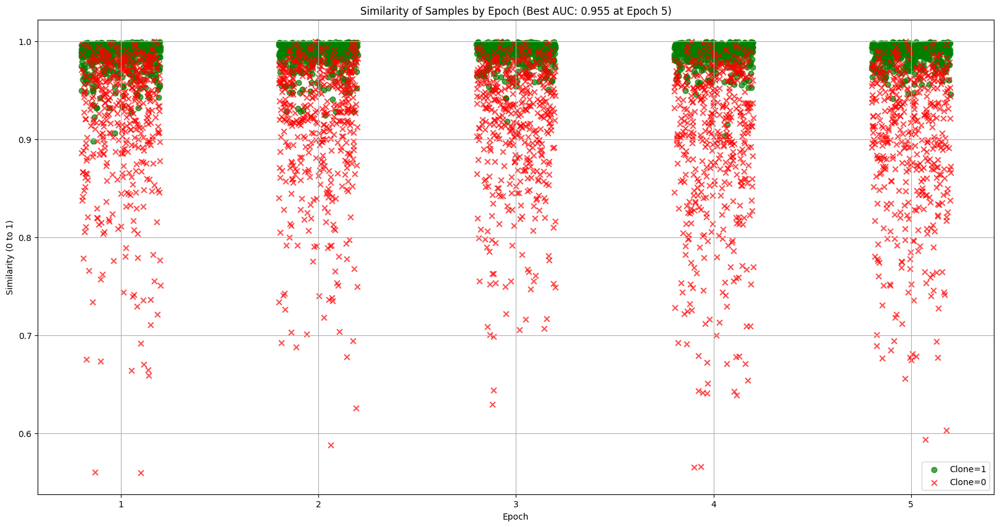

Epoch 6:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11585275271226185

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


Before
      epoch  similarity      label
0         1    0.946130  tensor(0)
1         1    0.966784  tensor(0)
2         1    0.904649  tensor(0)
3         1    0.978995  tensor(0)
4         1    0.933279  tensor(0)
...     ...         ...        ...
5659      6    0.917872  tensor(0)
5660      6    0.964301  tensor(0)
5661      6    0.995775  tensor(1)
5662      6    0.919650  tensor(0)
5663      6    0.995980  tensor(0)

[5664 rows x 3 columns]
after
      epoch  similarity      label
4720      6    0.983158  tensor(1)
4721      6    0.996701  tensor(1)
4722      6    0.881026  tensor(0)
4723      6    0.934861  tensor(0)
4724      6    0.918159  tensor(0)
...     ...         ...        ...
5659      6    0.917872  tensor(0)
5660      6    0.964301  tensor(0)
5661      6    0.995775  tensor(1)
5662      6    0.919650  tensor(0)
5663      6    0.995980  tensor(0)

[944 rows x 3 columns]
[1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0

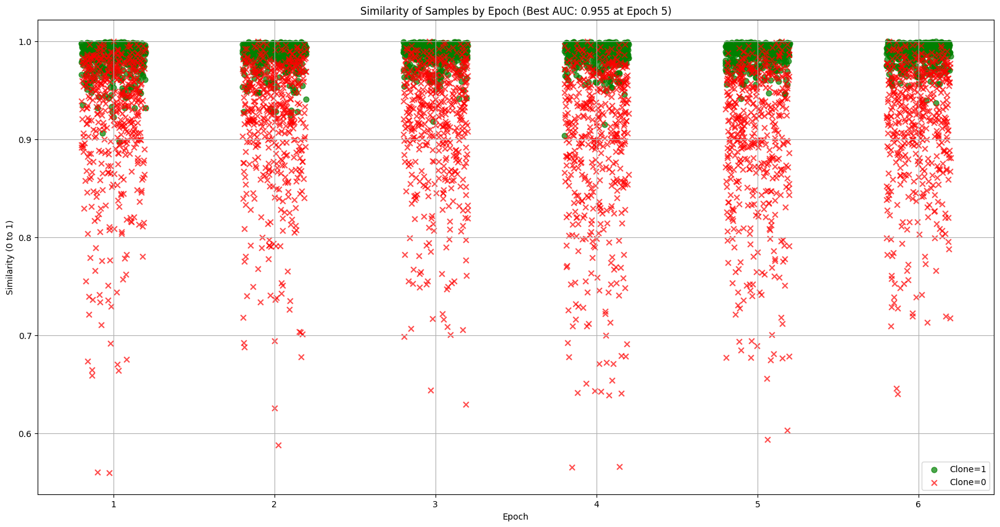

Epoch 7:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11398260522216369

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model
Before
      epoch  similarity      label
0         1    0.946130  tensor(0)
1         1    0.966784  tensor(0)
2         1    0.904649  tensor(0)
3         1    0.978995  tensor(0)
4         1    0.933279  tensor(0)
...     ...         ...        ...
6603      7    0.921259  tensor(0)
6604      7    0.901614  tensor(0)
6605      7    0.890694  tensor(0)
6606      7    0.835499  tensor(0)
6607      7    0.822869  tensor(0)

[6608 rows x 3 columns]
after
      epoch  similarity      label
5664      7    0.900251  tensor(0)
5665      7    0.995987  tensor(1)
5666      7    0.991326  tensor(1)
5667      7    0.985292  tensor(0)
5668      7    0.997689  tensor(1)
...     ...         ...        ...
6603      7    0.921259  tensor(0)
6604      7    0.901614  tensor(0)
6605      7    0.890694  tensor(0)
6606      7    0.835499  tensor(0)
6607      7    0.822869  tensor(0)

[944 rows x 3 columns]


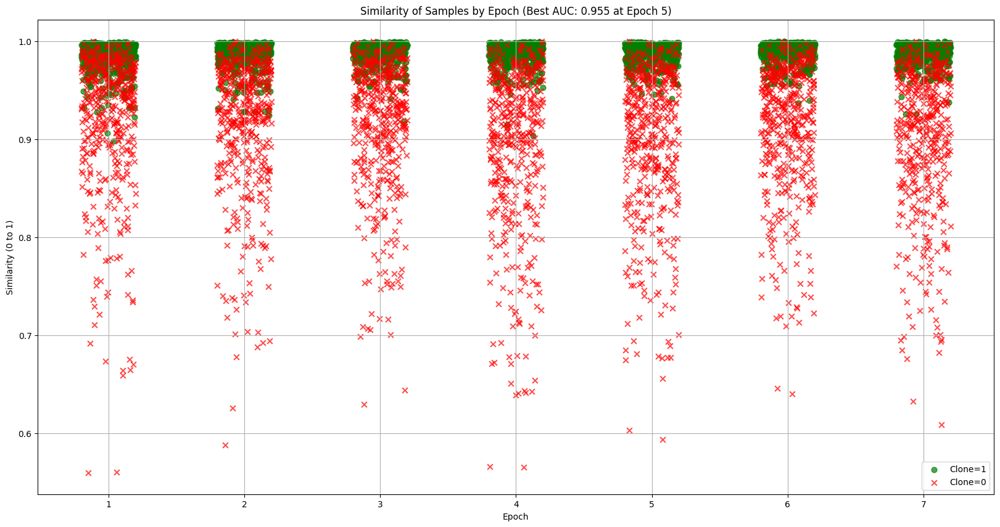

Epoch 8:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11415315110996428

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:28<00:00,  1.03it/s]


Before
      epoch  similarity      label
0         1    0.946130  tensor(0)
1         1    0.966784  tensor(0)
2         1    0.904649  tensor(0)
3         1    0.978995  tensor(0)
4         1    0.933279  tensor(0)
...     ...         ...        ...
7547      8    0.843140  tensor(0)
7548      8    0.993004  tensor(1)
7549      8    0.969256  tensor(0)
7550      8    0.987629  tensor(1)
7551      8    0.915565  tensor(0)

[7552 rows x 3 columns]
after
      epoch  similarity      label
6608      8    0.972099  tensor(0)
6609      8    0.967183  tensor(0)
6610      8    0.993439  tensor(1)
6611      8    0.955422  tensor(0)
6612      8    0.881335  tensor(0)
...     ...         ...        ...
7547      8    0.843140  tensor(0)
7548      8    0.993004  tensor(1)
7549      8    0.969256  tensor(0)
7550      8    0.987629  tensor(1)
7551      8    0.915565  tensor(0)

[944 rows x 3 columns]
[0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1

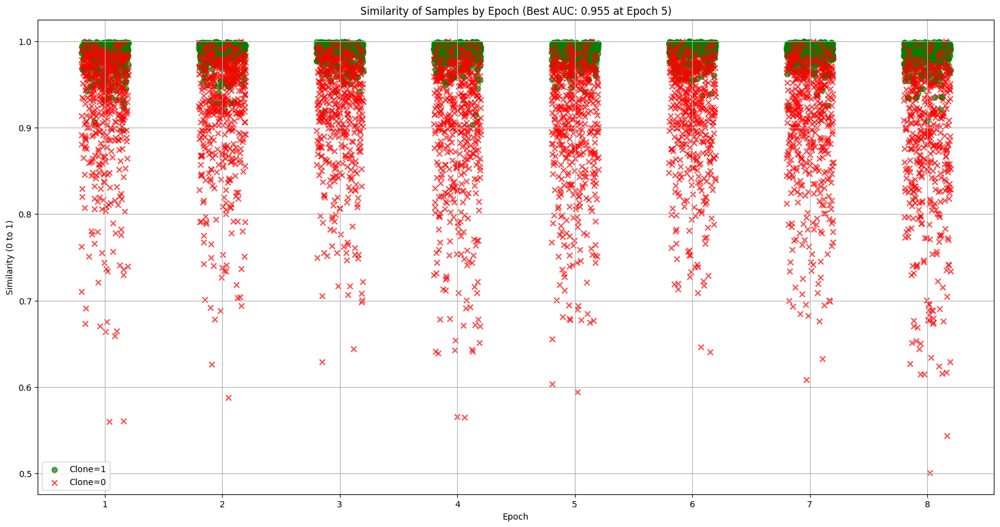

Epoch 9:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11270451054260544

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:28<00:00,  1.03it/s]


Before
      epoch  similarity      label
0         1    0.946130  tensor(0)
1         1    0.966784  tensor(0)
2         1    0.904649  tensor(0)
3         1    0.978995  tensor(0)
4         1    0.933279  tensor(0)
...     ...         ...        ...
8491      9    0.992268  tensor(1)
8492      9    0.999271  tensor(1)
8493      9    0.910815  tensor(0)
8494      9    0.912566  tensor(0)
8495      9    0.993156  tensor(1)

[8496 rows x 3 columns]
after
      epoch  similarity      label
7552      9    0.935594  tensor(0)
7553      9    0.915722  tensor(0)
7554      9    0.821376  tensor(0)
7555      9    0.972093  tensor(1)
7556      9    0.992380  tensor(1)
...     ...         ...        ...
8491      9    0.992268  tensor(1)
8492      9    0.999271  tensor(1)
8493      9    0.910815  tensor(0)
8494      9    0.912566  tensor(0)
8495      9    0.993156  tensor(1)

[944 rows x 3 columns]
[0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0

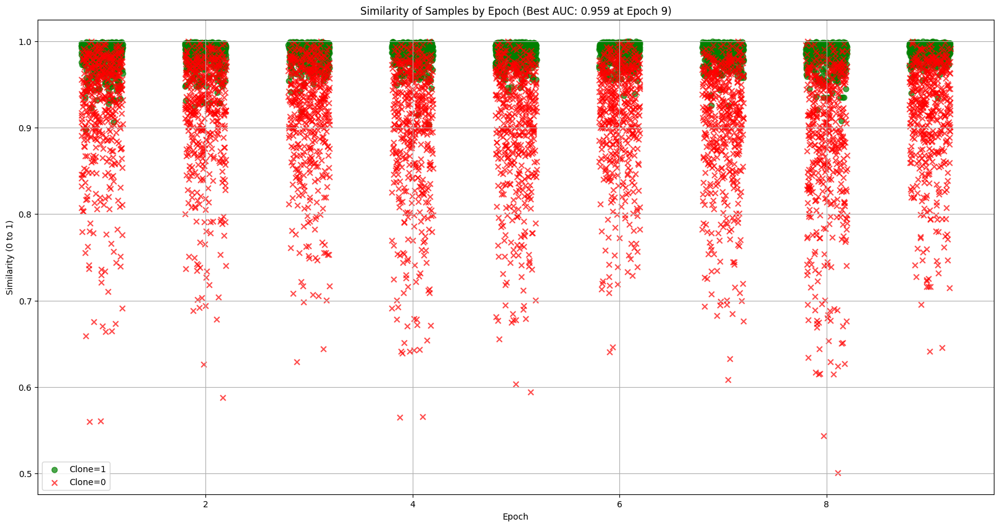

Epoch 10:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.1136322833014845

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model
Before
      epoch  similarity      label
0         1    0.946130  tensor(0)
1         1    0.966784  tensor(0)
2         1    0.904649  tensor(0)
3         1    0.978995  tensor(0)
4         1    0.933279  tensor(0)
...     ...         ...        ...
9435     10    0.991598  tensor(1)
9436     10    0.996364  tensor(1)
9437     10    0.853144  tensor(0)
9438     10    0.951897  tensor(1)
9439     10    0.708737  tensor(0)

[9440 rows x 3 columns]
after
      epoch  similarity      label
8496     10    0.838657  tensor(0)
8497     10    0.988685  tensor(1)
8498     10    0.733551  tensor(0)
8499     10    0.832951  tensor(0)
8500     10    0.999077  tensor(1)
...     ...         ...        ...
9435     10    0.991598  tensor(1)
9436     10    0.996364  tensor(1)
9437     10    0.853144  tensor(0)
9438     10    0.951897  tensor(1)
9439     10    0.708737  tensor(0)

[944 rows x 3 columns]


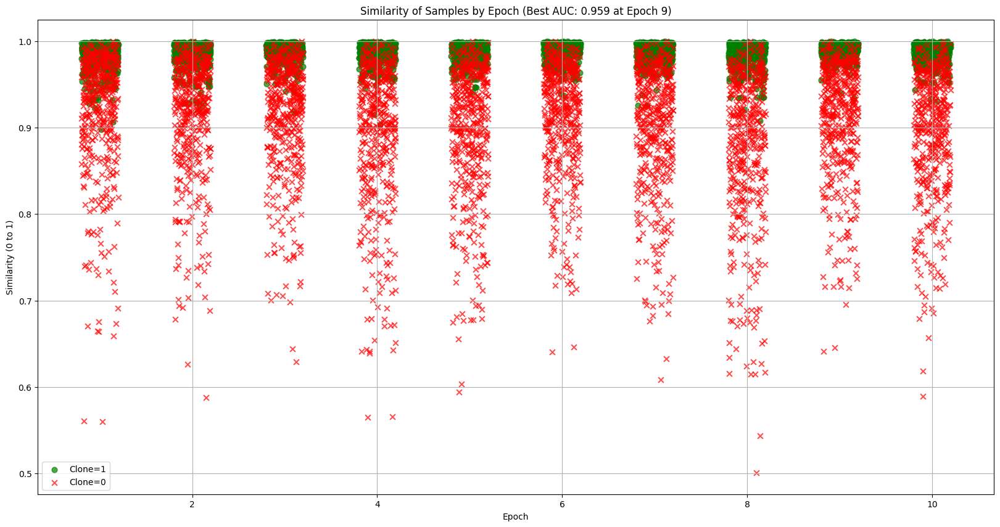

Epoch 11:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11131746322704168

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:28<00:00,  1.04it/s]


Before
       epoch  similarity      label
0          1    0.946130  tensor(0)
1          1    0.966784  tensor(0)
2          1    0.904649  tensor(0)
3          1    0.978995  tensor(0)
4          1    0.933279  tensor(0)
...      ...         ...        ...
10379     11    0.938629  tensor(0)
10380     11    0.989816  tensor(1)
10381     11    0.920309  tensor(0)
10382     11    0.967654  tensor(0)
10383     11    0.973624  tensor(0)

[10384 rows x 3 columns]
after
       epoch  similarity      label
9440      11    0.937566  tensor(0)
9441      11    0.966171  tensor(1)
9442      11    0.882598  tensor(0)
9443      11    0.973603  tensor(1)
9444      11    0.918866  tensor(0)
...      ...         ...        ...
10379     11    0.938629  tensor(0)
10380     11    0.989816  tensor(1)
10381     11    0.920309  tensor(0)
10382     11    0.967654  tensor(0)
10383     11    0.973624  tensor(0)

[944 rows x 3 columns]
[0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 

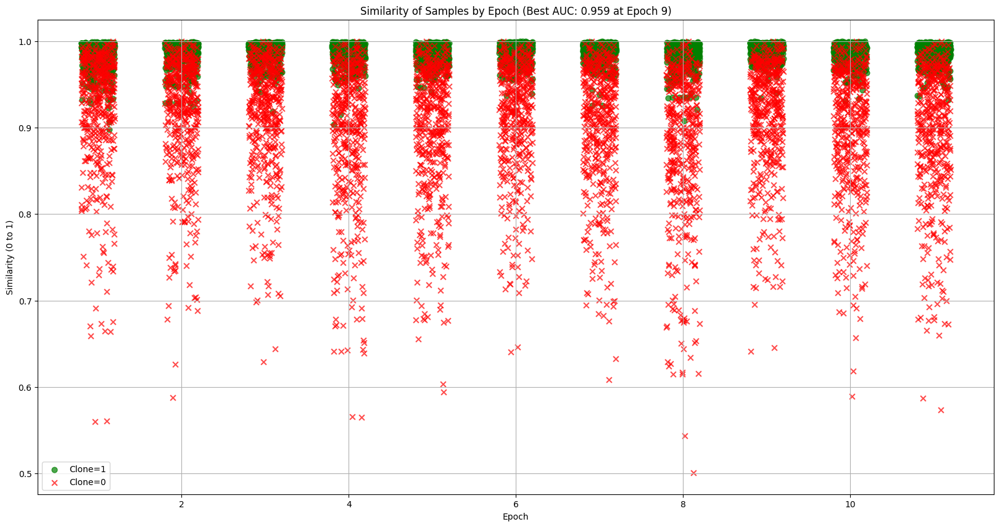

Epoch 12:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11103475923171507

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


Before
       epoch  similarity      label
0          1    0.946130  tensor(0)
1          1    0.966784  tensor(0)
2          1    0.904649  tensor(0)
3          1    0.978995  tensor(0)
4          1    0.933279  tensor(0)
...      ...         ...        ...
11323     12    0.909290  tensor(0)
11324     12    0.907895  tensor(0)
11325     12    0.750668  tensor(0)
11326     12    0.994250  tensor(0)
11327     12    0.978466  tensor(0)

[11328 rows x 3 columns]
after
       epoch  similarity      label
10384     12    0.947767  tensor(0)
10385     12    0.987677  tensor(1)
10386     12    0.972484  tensor(0)
10387     12    0.994233  tensor(0)
10388     12    0.829189  tensor(0)
...      ...         ...        ...
11323     12    0.909290  tensor(0)
11324     12    0.907895  tensor(0)
11325     12    0.750668  tensor(0)
11326     12    0.994250  tensor(0)
11327     12    0.978466  tensor(0)

[944 rows x 3 columns]
[0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 

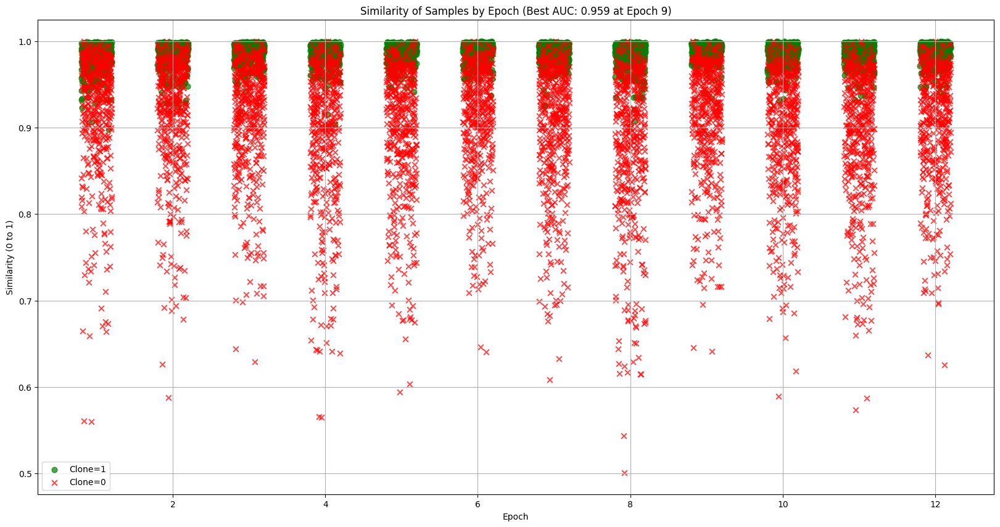

Epoch 13:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11198996402023963

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model
Before
       epoch  similarity      label
0          1    0.946130  tensor(0)
1          1    0.966784  tensor(0)
2          1    0.904649  tensor(0)
3          1    0.978995  tensor(0)
4          1    0.933279  tensor(0)
...      ...         ...        ...
12267     13    0.993585  tensor(1)
12268     13    0.983819  tensor(1)
12269     13    0.831565  tensor(0)
12270     13    0.985320  tensor(1)
12271     13    0.993093  tensor(1)

[12272 rows x 3 columns]
after
       epoch  similarity      label
11328     13    0.967979  tensor(1)
11329     13    0.994561  tensor(1)
11330     13    0.995921  tensor(1)
11331     13    0.995454  tensor(1)
11332     13    0.947212  tensor(0)
...      ...         ...        ...
12267     13    0.993585  tensor(1)
12268     13    0.983819  tensor(1)
12269     13    0.831565  tensor(0)
12270     13    0.985320  tensor(1)
12271     13    0.993093  tensor(1)

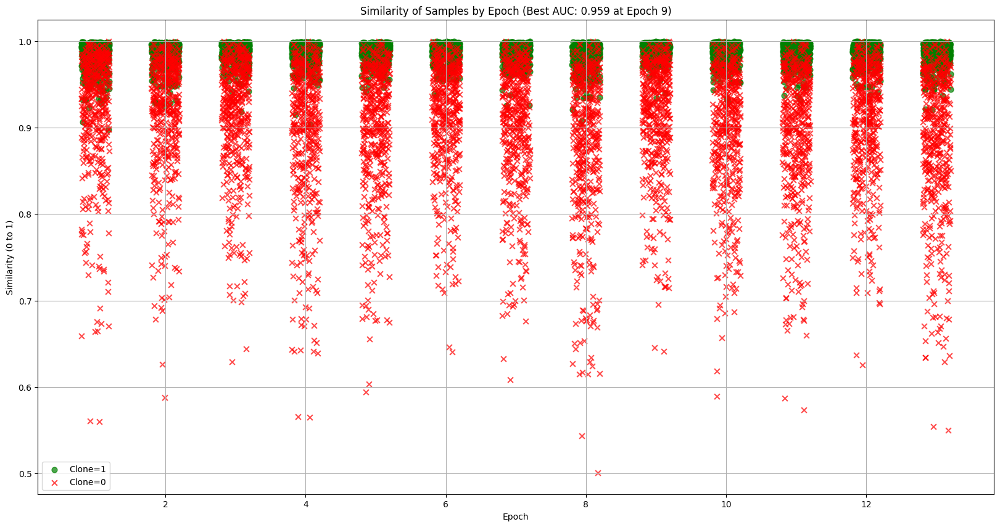

Epoch 14:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11122993751572756

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


Before
       epoch  similarity      label
0          1    0.946130  tensor(0)
1          1    0.966784  tensor(0)
2          1    0.904649  tensor(0)
3          1    0.978995  tensor(0)
4          1    0.933279  tensor(0)
...      ...         ...        ...
13211     14    0.857589  tensor(0)
13212     14    0.996995  tensor(0)
13213     14    0.971619  tensor(1)
13214     14    0.972417  tensor(0)
13215     14    0.985886  tensor(0)

[13216 rows x 3 columns]
after
       epoch  similarity      label
12272     14    0.995524  tensor(1)
12273     14    0.977585  tensor(1)
12274     14    0.827400  tensor(0)
12275     14    0.978287  tensor(0)
12276     14    0.843046  tensor(0)
...      ...         ...        ...
13211     14    0.857589  tensor(0)
13212     14    0.996995  tensor(0)
13213     14    0.971619  tensor(1)
13214     14    0.972417  tensor(0)
13215     14    0.985886  tensor(0)

[944 rows x 3 columns]
[1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 

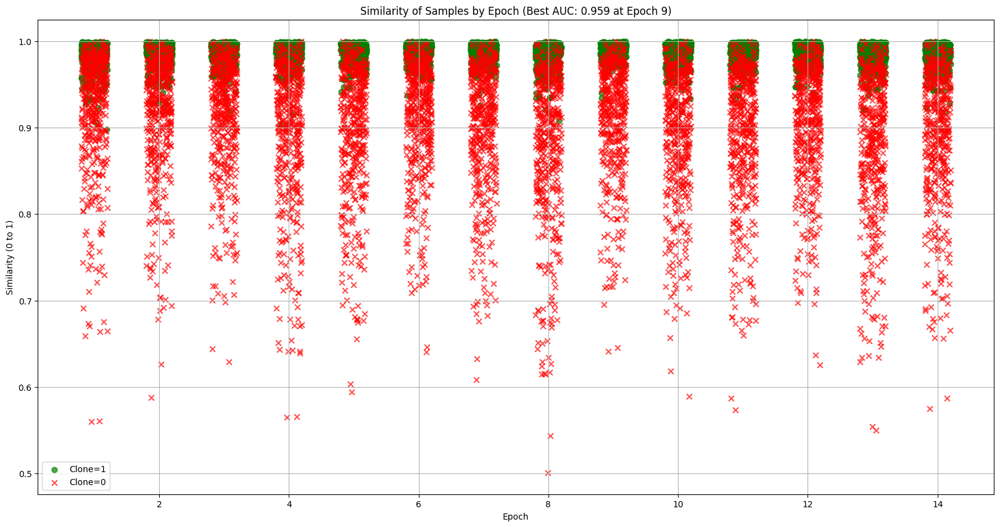

Epoch 15:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11062688259191292

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


Before
       epoch  similarity      label
0          1    0.946130  tensor(0)
1          1    0.966784  tensor(0)
2          1    0.904649  tensor(0)
3          1    0.978995  tensor(0)
4          1    0.933279  tensor(0)
...      ...         ...        ...
14155     15    0.840044  tensor(0)
14156     15    0.984278  tensor(1)
14157     15    0.992183  tensor(1)
14158     15    0.997730  tensor(1)
14159     15    0.994291  tensor(1)

[14160 rows x 3 columns]
after
       epoch  similarity      label
13216     15    0.994528  tensor(1)
13217     15    0.940567  tensor(0)
13218     15    0.993920  tensor(1)
13219     15    0.957907  tensor(0)
13220     15    0.996830  tensor(1)
...      ...         ...        ...
14155     15    0.840044  tensor(0)
14156     15    0.984278  tensor(1)
14157     15    0.992183  tensor(1)
14158     15    0.997730  tensor(1)
14159     15    0.994291  tensor(1)

[944 rows x 3 columns]
[1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 

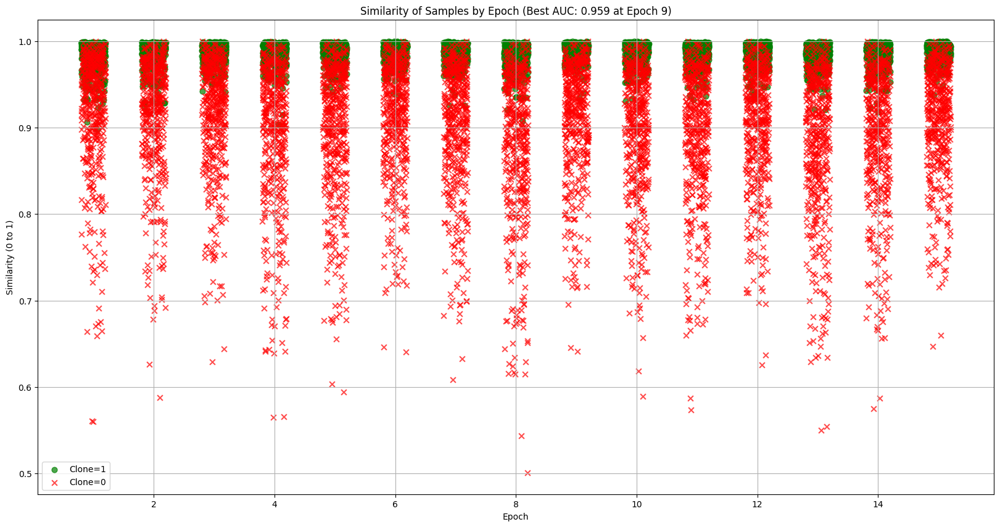

Epoch 16:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.11080564765641604

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:28<00:00,  1.03it/s]


saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model
Before
       epoch  similarity      label
0          1    0.946130  tensor(0)
1          1    0.966784  tensor(0)
2          1    0.904649  tensor(0)
3          1    0.978995  tensor(0)
4          1    0.933279  tensor(0)
...      ...         ...        ...
15099     16    0.937540  tensor(0)
15100     16    0.925596  tensor(0)
15101     16    0.867789  tensor(0)
15102     16    0.947552  tensor(0)
15103     16    0.892977  tensor(0)

[15104 rows x 3 columns]
after
       epoch  similarity      label
14160     16    0.939999  tensor(0)
14161     16    0.765922  tensor(0)
14162     16    0.986518  tensor(1)
14163     16    0.983794  tensor(0)
14164     16    0.997432  tensor(0)
...      ...         ...        ...
15099     16    0.937540  tensor(0)
15100     16    0.925596  tensor(0)
15101     16    0.867789  tensor(0)
15102     16    0.947552  tensor(0)
15103     16    0.892977  tensor(0)

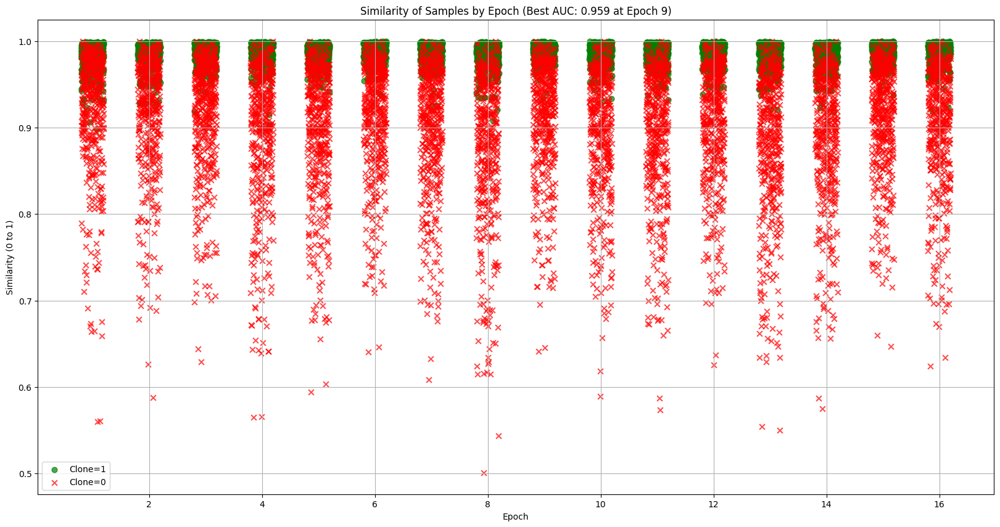

Epoch 17:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.10989474436665943

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


Before
       epoch  similarity      label
0          1    0.946130  tensor(0)
1          1    0.966784  tensor(0)
2          1    0.904649  tensor(0)
3          1    0.978995  tensor(0)
4          1    0.933279  tensor(0)
...      ...         ...        ...
16043     17    0.965825  tensor(0)
16044     17    0.995598  tensor(1)
16045     17    0.996828  tensor(1)
16046     17    0.884059  tensor(0)
16047     17    0.982728  tensor(1)

[16048 rows x 3 columns]
after
       epoch  similarity      label
15104     17    0.993563  tensor(1)
15105     17    0.996972  tensor(1)
15106     17    0.993594  tensor(1)
15107     17    0.853159  tensor(0)
15108     17    0.989003  tensor(1)
...      ...         ...        ...
16043     17    0.965825  tensor(0)
16044     17    0.995598  tensor(1)
16045     17    0.996828  tensor(1)
16046     17    0.884059  tensor(0)
16047     17    0.982728  tensor(1)

[944 rows x 3 columns]
[1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 

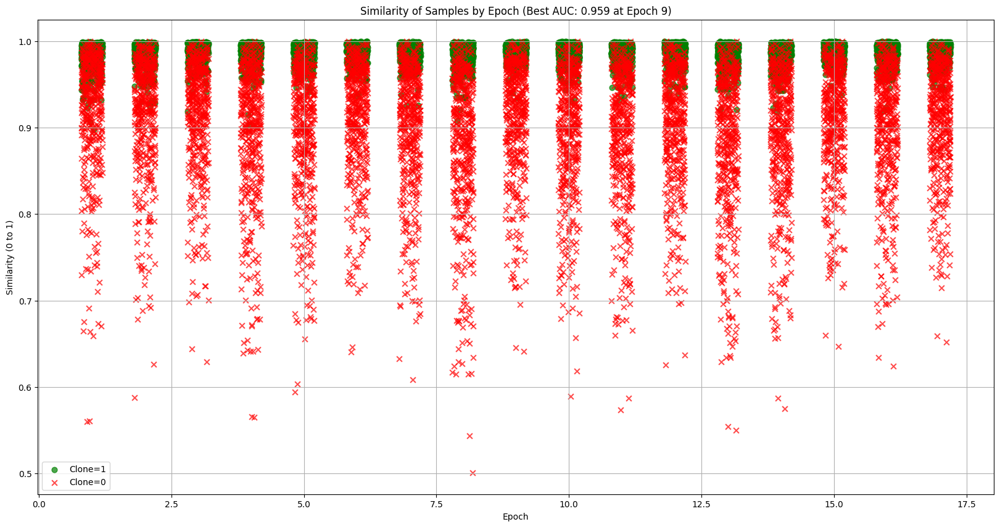

Epoch 18:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.1107419290546383

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


Before
       epoch  similarity      label
0          1    0.946130  tensor(0)
1          1    0.966784  tensor(0)
2          1    0.904649  tensor(0)
3          1    0.978995  tensor(0)
4          1    0.933279  tensor(0)
...      ...         ...        ...
16987     18    0.961550  tensor(0)
16988     18    0.948117  tensor(0)
16989     18    0.990209  tensor(1)
16990     18    0.979012  tensor(1)
16991     18    0.954580  tensor(0)

[16992 rows x 3 columns]
after
       epoch  similarity      label
16048     18    0.914186  tensor(0)
16049     18    0.909215  tensor(0)
16050     18    0.991416  tensor(1)
16051     18    0.977577  tensor(1)
16052     18    0.988216  tensor(1)
...      ...         ...        ...
16987     18    0.961550  tensor(0)
16988     18    0.948117  tensor(0)
16989     18    0.990209  tensor(1)
16990     18    0.979012  tensor(1)
16991     18    0.954580  tensor(0)

[944 rows x 3 columns]
[0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 

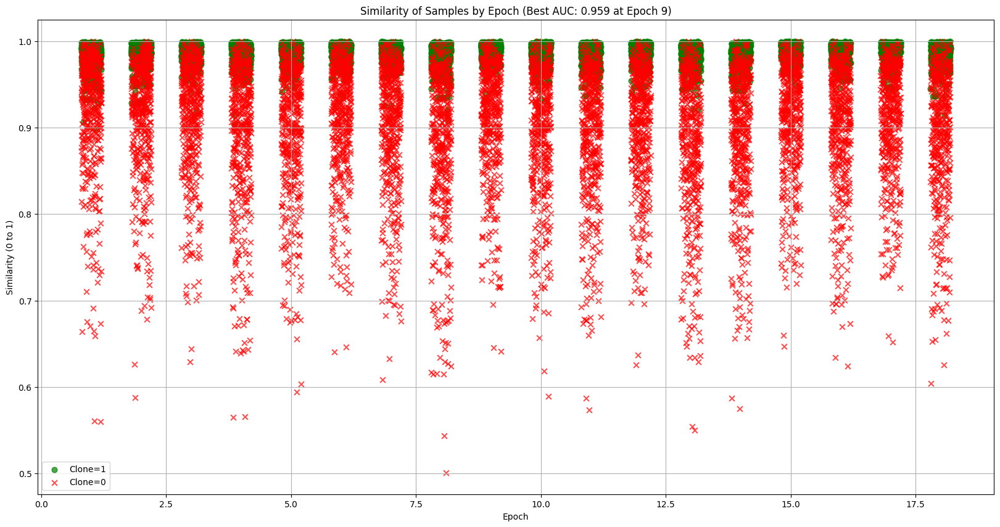

Epoch 19:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.10999740490859206

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


Before
       epoch  similarity      label
0          1    0.946130  tensor(0)
1          1    0.966784  tensor(0)
2          1    0.904649  tensor(0)
3          1    0.978995  tensor(0)
4          1    0.933279  tensor(0)
...      ...         ...        ...
17931     19    0.993478  tensor(1)
17932     19    0.992469  tensor(1)
17933     19    0.993941  tensor(1)
17934     19    0.976561  tensor(1)
17935     19    0.992631  tensor(1)

[17936 rows x 3 columns]
after
       epoch  similarity      label
16992     19    0.995926  tensor(1)
16993     19    0.895369  tensor(0)
16994     19    0.748420  tensor(0)
16995     19    0.994733  tensor(1)
16996     19    0.875258  tensor(0)
...      ...         ...        ...
17931     19    0.993478  tensor(1)
17932     19    0.992469  tensor(1)
17933     19    0.993941  tensor(1)
17934     19    0.976561  tensor(1)
17935     19    0.992631  tensor(1)

[944 rows x 3 columns]
[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 

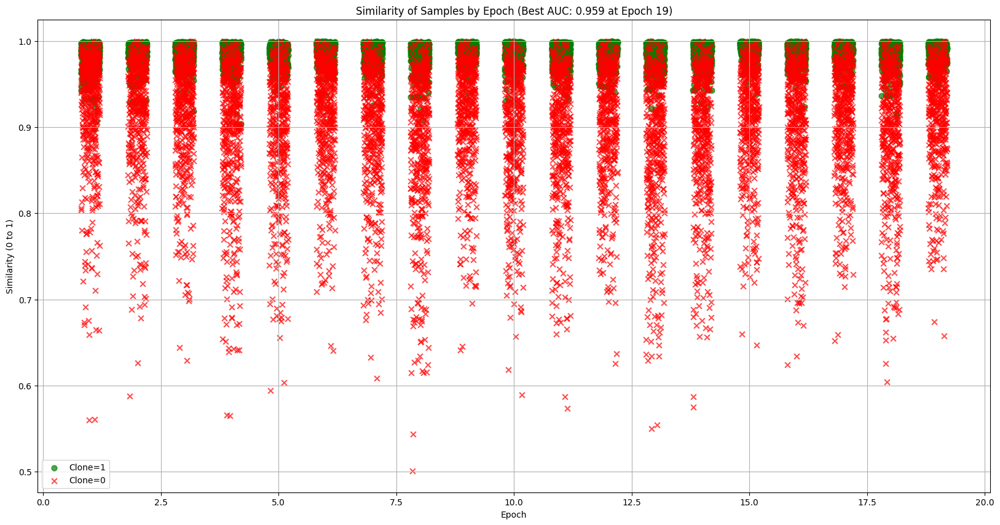

Epoch 20:


Training: 100%|██████████| 473/473 [02:59<00:00,  2.63it/s]


training loss 0.10951140089783558

Evaluating on validation set...


Validation: 100%|██████████| 30/30 [00:29<00:00,  1.03it/s]


saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model
Before
       epoch  similarity      label
0          1    0.946130  tensor(0)
1          1    0.966784  tensor(0)
2          1    0.904649  tensor(0)
3          1    0.978995  tensor(0)
4          1    0.933279  tensor(0)
...      ...         ...        ...
18875     20    0.986292  tensor(1)
18876     20    0.849417  tensor(0)
18877     20    0.953500  tensor(0)
18878     20    0.869102  tensor(0)
18879     20    0.996827  tensor(1)

[18880 rows x 3 columns]
after
       epoch  similarity      label
17936     20    0.971367  tensor(1)
17937     20    0.818573  tensor(0)
17938     20    0.993685  tensor(1)
17939     20    0.958275  tensor(0)
17940     20    0.762002  tensor(0)
...      ...         ...        ...
18875     20    0.986292  tensor(1)
18876     20    0.849417  tensor(0)
18877     20    0.953500  tensor(0)
18878     20    0.869102  tensor(0)
18879     20    0.996827  tensor(1)

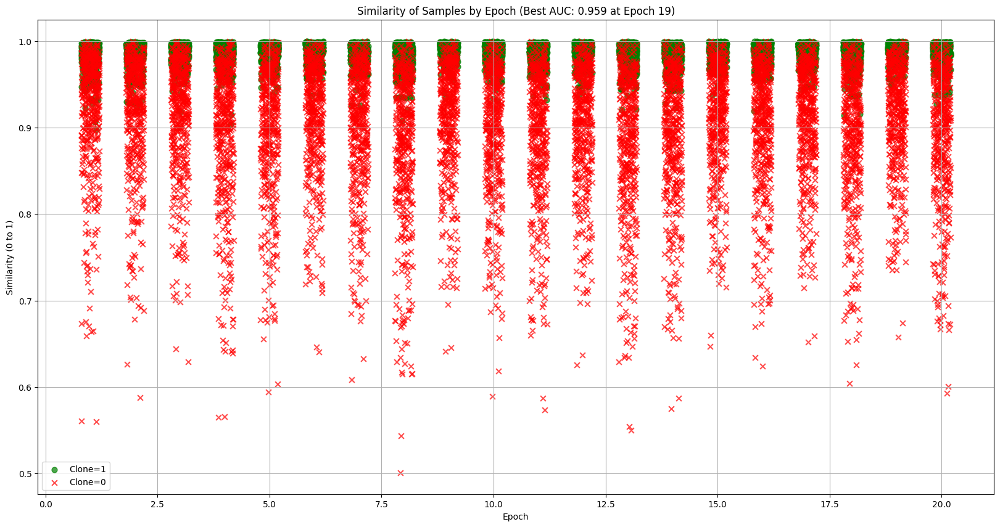

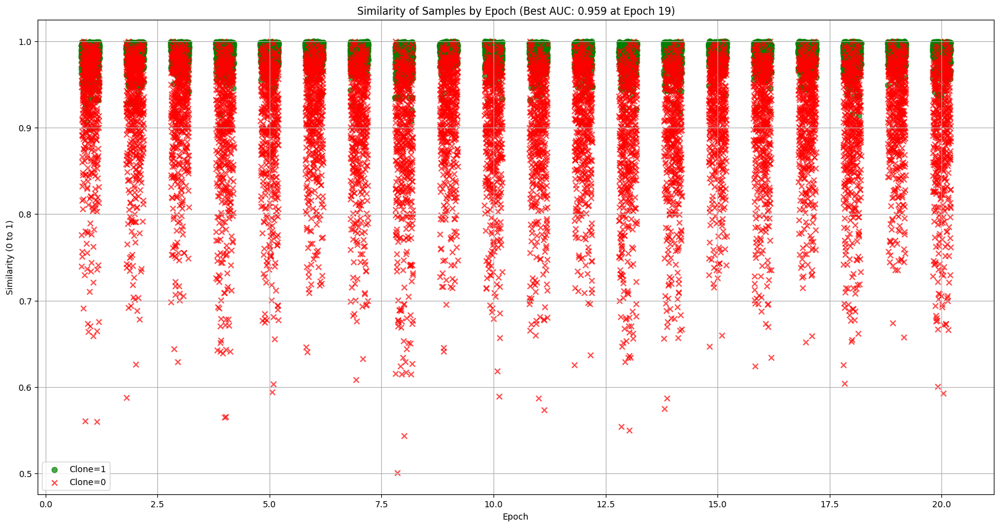

saving best model
Model saved successfully to Google Drive at: /content/drive/MyDrive/saved_model


In [ ]:
model, tokenizer ,history , similarity_data = start_training(load_trained_model = False)


In [ ]:
similarity_data

[{'epoch': 1, 'similarity': 0.946129560470581, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.9667837023735046, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.9046491384506226, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.9789950847625732, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.9332789182662964, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.9347541332244873, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.7895708084106445, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.9842025637626648, 'label': tensor(1)},
 {'epoch': 1, 'similarity': 0.916688859462738, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.9439429044723511, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.9970846176147461, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.8591431379318237, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.9912844300270081, 'label': tensor(1)},
 {'epoch': 1, 'similarity': 0.9584663510322571, 'label': tensor(0)},
 {'epoch': 1, 'similarity': 0.979557

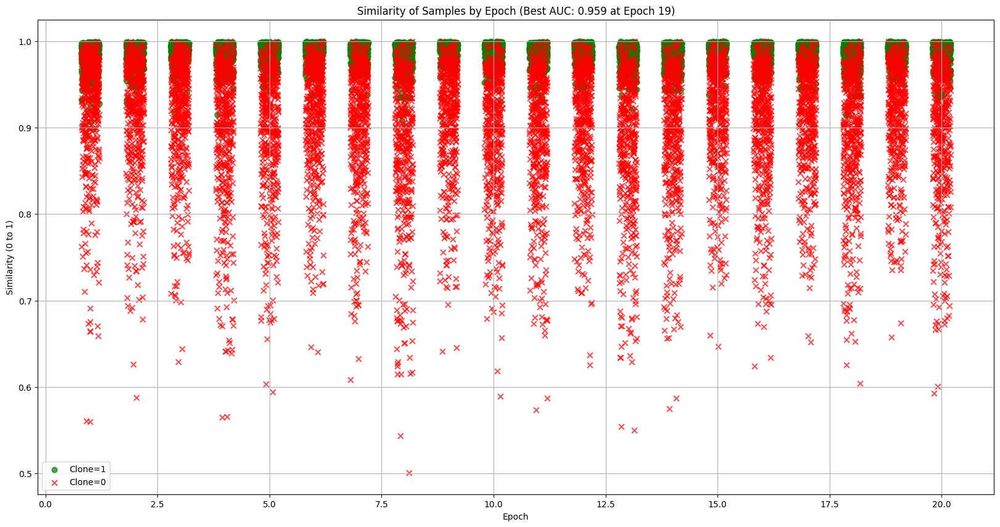

In [ ]:
plot_similarity_scatter(similarity_data)


df loaded with 18894 rows and Index(['function 1', 'function 2', 'clone'], dtype='object') columns
working with cuda


Testing: 100%|██████████| 23/23 [01:29<00:00,  3.88s/it]


Before
      similarity      label
0       0.999441  tensor(1)
1       0.965218  tensor(0)
2       0.945321  tensor(0)
3       0.991826  tensor(1)
4       0.990330  tensor(1)
...          ...        ...
2830    0.836752  tensor(0)
2831    0.996980  tensor(1)
2832    0.994817  tensor(1)
2833    0.995106  tensor(1)
2834    0.972698  tensor(0)

[2835 rows x 2 columns]
after
      similarity      label
0       0.999441  tensor(1)
1       0.965218  tensor(0)
2       0.945321  tensor(0)
3       0.991826  tensor(1)
4       0.990330  tensor(1)
...          ...        ...
2830    0.836752  tensor(0)
2831    0.996980  tensor(1)
2832    0.994817  tensor(1)
2833    0.995106  tensor(1)
2834    0.972698  tensor(0)

[2835 rows x 2 columns]
[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 

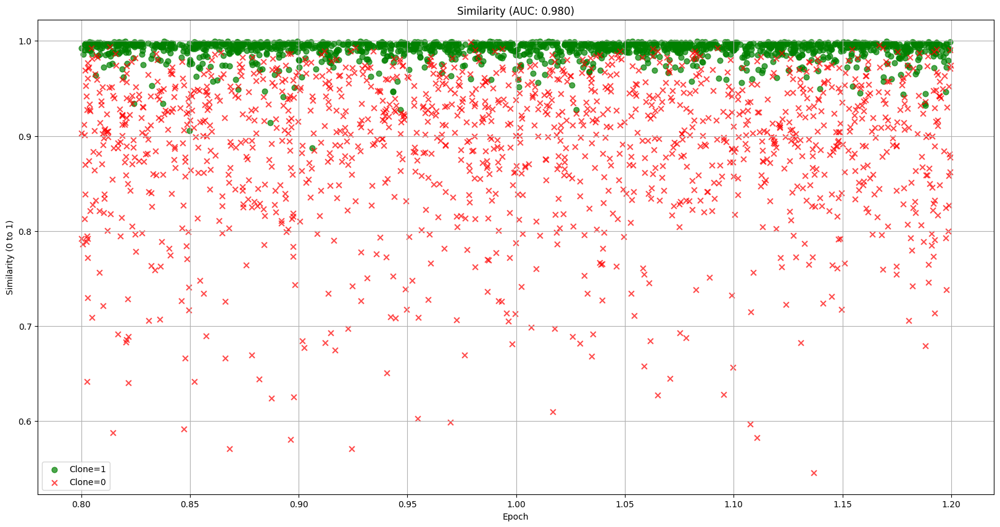

In [ ]:
def start_testing(model):
    Traindataloader,validationDataloader, Testdataloader  = get_dataloaders(
        batch_size=128,
        num_workers=16
    )

    print("working with cuda") if torch.cuda.is_available() else print("working with cpu")
    similarity_data = test_model(
        model,
        Testdataloader,
        device,

    )
    # Save the model after training
    return similarity_data
similarity_data = start_testing(model)


In [ ]:
def calculate_auc(similarity_data, epoch=None):
    """Calculate AUC for a specific epoch or all data if epoch is None"""
    df = pd.DataFrame(similarity_data)

    if epoch is not None:
        df = df[df['epoch'] == epoch]

    # Get the true labels and similarity scores
    y_true = [f.item() for f in df['label']]
    y_scores = df['similarity']

    # Calculate ROC AUC
    auc = roc_auc_score(y_true, y_scores)
    return auc

print(f"test AUC")

test AUC


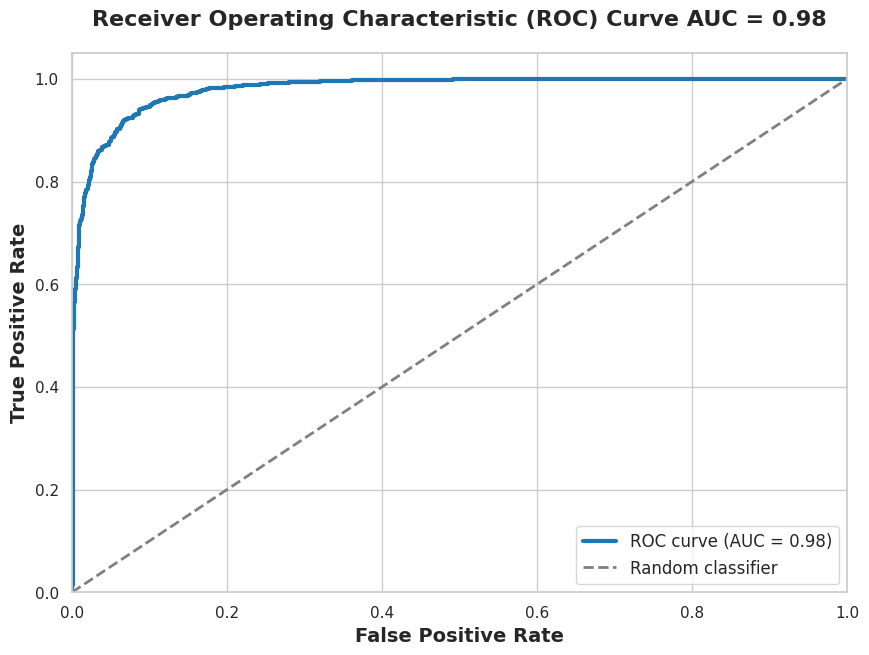

In [ ]:

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
def plot_roc_curve(similarity_data):
    # Convert data to a DataFrame for easier processing
    df = pd.DataFrame(similarity_data)

    # Extract true labels and similarity scores
    y_true = [f.item() for f in df['label']]  # Ground truth
    y_scores = df['similarity']  # Predicted scores

    # Compute ROC curve
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)  # Compute the Area Under the Curve (AUC)

    # Plot the ROC curve
    plt.figure(figsize=(10, 7))
    sns.set_theme(style="whitegrid")  # Use Seaborn for better aesthetics

    # Main ROC curve
    plt.plot(fpr, tpr, color='#1f77b4', lw=3, label=f"ROC curve (AUC = {roc_auc:.2f})")

    # Random classifier line
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random classifier")

    # Set limits
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])

    # Add labels, title, and legend
    plt.xlabel("False Positive Rate", fontsize=14, fontweight='bold')
    plt.ylabel("True Positive Rate", fontsize=14, fontweight='bold')
    plt.title(f"Receiver Operating Characteristic (ROC) Curve AUC = {round(roc_auc,4)}", fontsize=16, fontweight='bold', pad=20)
    plt.legend(loc="lower right", fontsize=12)

    # Show the plot
    plt.show()


plot_roc_curve(similarity_data)


In [ ]:
loaded_model, loaded_tokenizer, config = load_model('saved_model')
predictor = CodeClonePredictor(loaded_model, loaded_tokenizer)

# Compare two code snippets
code1 = '''
int main (int argc, char **argv) {
    int tree1 = 14;
    int tree2 = 7;
    int tree3 = 16;
    int limit = 11;
    int cutamounttotal = 0;
    cutamounttotal += CUTAMOUNT (tree1, limit);
    cutamounttotal += CUTAMOUNT (tree2, limit);
    cutamounttotal += CUTAMOUNT (tree3, limit);
    printf ("Amount to remove: %d\n", cutamounttotal);
    return 0;
}
'''

code2 = '''
int main () {
=    cutamounttotal += CUTAMOUNT (tree3, limit);
    printf ("Amount to remove: %d\n", cutamounttotal);
    return 0;
}
'''

similarity = predictor.compare_codes(code1, code2)
print(f"Similarity score: {similarity:.3f}")



Model loaded successfully from: /content/drive/MyDrive/saved_model
Similarity score: 0.990


In [ ]:
code3 = '''
jshdjgdskhglkshdljgksd}
'''

similarity = predictor.compare_codes(code1, code3)
print(f"Similarity score: {similarity:.3f}")

Similarity score: 0.964


In [ ]:
# Find clones in a list of codes
code_list = [ code2, "other code snippets...", "public class Fibonacci {"]
clones = predictor.find_clones(code1, code_list, threshold=0.98)

for clone in clones:
    print(f"Clone found with similarity: {clone['similarity']:.3f}")
    print("Code:")
    print(clone['code'])
    print("-" * 50)


Clone found with similarity: 0.990
Code:

int main () {
=    cutamounttotal += CUTAMOUNT (tree3, limit);
    printf ("Amount to remove: %d
", cutamounttotal);
    return 0;
}

--------------------------------------------------
